In [1]:
# pyspark-3.4.1
# graphframes-0.6

from pyspark.sql import SparkSession, functions as F, Window
from graphframes import GraphFrame
import networkx as nx
import matplotlib.pyplot as plt
import csv
import math
import json
import random

import warnings
warnings.filterwarnings("ignore")

## 1. Предварительная обработка данных

In [2]:
spark = (SparkSession.builder
         .appName("amazon")
         .master("local[*]")
         .config("spark.driver.memory", "4g")
         .config("spark.sql.shuffle.partitions", "8")
         .config("spark.jars.packages", "graphframes:graphframes:0.8.3-spark3.4-s_2.12")
         .getOrCreate())

spark.sparkContext.setLogLevel("ERROR")

bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
26/06/21 19:45:25 WARN Utils: Your hostname, xeocean resolves to a loopback address: 127.0.1.1; using 10.255.255.254 instead (on interface lo)
26/06/21 19:45:25 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address


:: loading settings :: url = jar:file:/home/xeocean/.virtualenvs/DS/lib/python3.12/site-packages/pyspark/jars/ivy-2.5.1.jar!/org/apache/ivy/core/settings/ivysettings.xml


Ivy Default Cache set to: /home/xeocean/.ivy2/cache
The jars for the packages stored in: /home/xeocean/.ivy2/jars
graphframes#graphframes added as a dependency
:: resolving dependencies :: org.apache.spark#spark-submit-parent-219ea7e3-1d37-4da7-b7a5-515c62f67cda;1.0
	confs: [default]
	found graphframes#graphframes;0.8.3-spark3.4-s_2.12 in spark-packages
	found org.slf4j#slf4j-api;1.7.16 in central
:: resolution report :: resolve 224ms :: artifacts dl 5ms
	:: modules in use:
	graphframes#graphframes;0.8.3-spark3.4-s_2.12 from spark-packages in [default]
	org.slf4j#slf4j-api;1.7.16 from central in [default]
	---------------------------------------------------------------------
	|                  |            modules            ||   artifacts   |
	|       conf       | number| search|dwnlded|evicted|| number|dwnlded|
	---------------------------------------------------------------------
	|      default     |   2   |   0   |   0   |   0   ||   2   |   0   |
	-------------------------------

In [3]:
# Разбор текстового файла в список товаров
lines = spark.read.text("../datasets/amazon-meta.txt/amazon-meta.txt").rdd.map(lambda r: r[0]).collect()

products, cur = [], {}
for line in lines:
    line = line.strip()
    if line.startswith("Id:"):
        if cur:
            products.append(cur)
        cur = {"asin": None, "title": None, "group": None, "similar": []}
    elif line.startswith("ASIN:"):
        cur["asin"] = line.split(":")[1].strip()
    elif line.startswith("title:"):
        cur["title"] = line.split(":", 1)[1].strip()
    elif line.startswith("group:"):
        cur["group"] = line.split(":")[1].strip()
    elif line.startswith("similar:"):
        cur["similar"] = line.split()[2:]
if cur:
    products.append(cur)

In [4]:
# Первые 3 товара для проверки
products[:3]

[{'asin': '0771044445', 'title': None, 'group': None, 'similar': []},
 {'asin': '0827229534',
  'title': 'Patterns of Preaching: A Sermon Sampler',
  'group': 'Book',
  'similar': ['0804215715',
   '156101074X',
   '0687023955',
   '0687074231',
   '082721619X']},
 {'asin': '0738700797',
  'title': 'Candlemas: Feast of Flames',
  'group': 'Book',
  'similar': ['0738700827',
   '1567184960',
   '1567182836',
   '0738700525',
   '0738700940']}]

In [5]:
# Вершины (товары) и рёбра (что товар рекомендует), граф сопокупок
products_df = spark.createDataFrame(
    [(p["asin"], p["title"], p["group"]) for p in products if p["asin"]],
    ["id", "title", "group"]).repartition(16)

edges_df = spark.createDataFrame(
    [(p["asin"], s) for p in products if p["asin"] for s in p["similar"]],
    ["src", "dst"]).repartition(16)

g = GraphFrame(products_df, edges_df)

In [6]:
# Первые 10 вершин для проверки
products_df.show(10)

+----------+--------------------+-----+
|        id|               title|group|
+----------+--------------------+-----+
|0121780813|Habitat Selection...| Book|
|B000006UNM|L'Homme De La Mancha|Music|
|6302766885|            Antigone|Video|
|0881661686|Successful Breast...| Book|
|089733504X|         Celibidache| Book|
|083851474X|Critical Care Cer...| Book|
|0060977612|God Is My Broker:...| Book|
|0595214355|Secrets of the Pa...| Book|
|006053821X|The Companions : ...| Book|
|0195288017|The New Oxford An...| Book|
+----------+--------------------+-----+
only showing top 10 rows



In [7]:
# Первые 10 рёбер для проверки
edges_df.show(10)

+----------+----------+
|       src|       dst|
+----------+----------+
|0785212329|0842345647|
|9774245261|0385264763|
|0834217287|0781739462|
|1584651687|1400040310|
|0130086959|0321219775|
|1561795313|1586091859|
|0534391869|0131416588|
|0471252670|0471152803|
|1568811373|1558605991|
|0300062915|0674075900|
+----------+----------+
only showing top 10 rows



## 2. Описательный анализ

In [8]:
# Количество книг, музыки и спортивных товаров
counts = {r["group"]: r["count"] for r in products_df.groupBy("group").count().collect()}
num_books = counts.get("Book", 0)
num_music = counts.get("Music", 0)
num_sport = counts.get("Sports", 0)
num_books, num_music, num_sport

(393561, 103144, 1)

In [9]:
# Максимальное количество исходящих рёбер для вершины
max_out_degree = edges_df.groupBy("src").count().agg(F.max("count")).first()[0]
max_out_degree

5

In [10]:
# Максимальное количество входящих рёбер и название товара
top_in = edges_df.groupBy("dst").count().orderBy(F.desc("count")).first()
max_in_degree = top_in["count"]
max_in_degree_title = products_df.filter(F.col("id") == top_in["dst"]).first()["title"]
max_in_degree, max_in_degree_title

(549, 'Laura')

In [11]:
# Доля взаимных связей (A->B и B->A)
e1 = edges_df.selectExpr("src as a", "dst as b")
e2 = edges_df.selectExpr("src as b", "dst as a")
reciprocity = round(e1.join(e2, ["a", "b"]).distinct().count() / edges_df.count(), 7)
reciprocity

0.2722576

In [12]:
# Товар, входящий в наибольшее число треугольников
most_triangles_title = g.triangleCount().orderBy(F.desc("count")).first()["title"]
most_triangles_title

'The TEMPEST'

In [13]:
# Самый важный товар по PageRank (reset=0.1, iter=10)
pr = g.pageRank(resetProbability=0.1, maxIter=10)
largest_pagerank_title = pr.vertices.orderBy(F.desc("pagerank")).first()["title"]
largest_pagerank_title

"Good to Great: Why Some Companies Make the Leap... and Others Don't"

## 3. Пакеты и коллекции

In [14]:
# Наборы из трёх товаров: A->B, C->B, при этом A и C рекомендуют друг друга
def bundles(e):
    ab = e.selectExpr("src as a", "dst as b")
    cb = e.selectExpr("src as c", "dst as b")
    ac = e.selectExpr("src as a", "dst as c")
    ca = e.selectExpr("dst as a", "src as c")
    mutual = ac.join(ca, ["a", "c"]).filter("a < c")
    return (mutual.join(ab, "a").join(cb, ["c", "b"])
            .filter("b != a and b != c").distinct().count())

num_bundles = bundles(edges_df)
num_bundles

518982

In [15]:
# Те же наборы, но только внутри группы Music
music = products_df.filter("group = 'Music'").select("id")
edges_music = (edges_df
               .join(music.withColumnRenamed("id", "src"), "src")
               .join(music.withColumnRenamed("id", "dst"), "dst")
               .select("src", "dst"))
num_music_bundles = bundles(edges_music)
num_music_bundles

97306

In [16]:
# Самая большая коллекция DVD (связаны через взаимные пути)
spark.sparkContext.setCheckpointDir("checkpoints")

dvd = products_df.filter("group = 'DVD'")
ids = dvd.select("id")
e_dvd = (edges_df
         .join(ids.withColumnRenamed("id", "src"), "src")
         .join(ids.withColumnRenamed("id", "dst"), "dst")
         .select("src", "dst"))

recip = e_dvd.join(e_dvd.selectExpr("dst as src", "src as dst"), ["src", "dst"]).distinct()
cc = GraphFrame(dvd, recip).connectedComponents()
num_collections = cc.groupBy("component").count().agg(F.max("count")).first()[0]
num_collections

1187

In [17]:
# Запись всех метрик в json

measures = {
    "num_books": num_books,
    "num_music": num_music,
    "num_sport": num_sport,
    "max_out_degree": max_out_degree,
    "max_in_degree": max_in_degree,
    "max_in_degree_title": max_in_degree_title,
    "reciprocity": reciprocity,
    "most_often_in_triangles_title": most_triangles_title,
    "largest_pagerank_title": largest_pagerank_title,
    "num_bundles": num_bundles,
    "num_music_bundles": num_music_bundles,
    "num_collections": num_collections,
}
with open("data/measures.json", "w") as f:
    json.dump(measures, f, indent=4, ensure_ascii=False)
measures

{'num_books': 393561,
 'num_music': 103144,
 'num_sport': 1,
 'max_out_degree': 5,
 'max_in_degree': 549,
 'max_in_degree_title': 'Laura',
 'reciprocity': 0.2722576,
 'most_often_in_triangles_title': 'The TEMPEST',
 'largest_pagerank_title': "Good to Great: Why Some Companies Make the Leap... and Others Don't",
 'num_bundles': 518982,
 'num_music_bundles': 97306,
 'num_collections': 1187}

## 4. Визуализация графа DVD

In [18]:
# Граф DVD для визуализации: 17 966 вершин, рёбра DVD->DVD
dvd_nodes = (edges_df.select(F.col("src").alias("id"))
             .union(edges_df.select(F.col("dst").alias("id")))
             .distinct().join(ids, "id"))

node_ids = [r.id for r in dvd_nodes.collect()]
edge_list = [(r.src, r.dst) for r in e_dvd.collect()]
title_by_id = {r.id: r.title for r in dvd.join(dvd_nodes, "id").select("id", "title").collect()}

G = nx.DiGraph()
G.add_nodes_from(node_ids)
G.add_edges_from(edge_list)
nx.set_node_attributes(G, title_by_id, "title")
G.number_of_nodes(), G.number_of_edges()

(17966, 50908)

In [19]:
# Отрисовка: размер и цвет вершины по in-degree, хабы подписаны, экспорт в png и svg
def draw(pos, title, edge_color, cmap, fname):
    indeg = dict(G.in_degree())
    m = max(indeg.values()) or 1
    order = list(G.nodes())
    sizes = [8 + 600 * indeg[n] / m for n in order]
    colors = [indeg[n] for n in order]

    fig, ax = plt.subplots(figsize=(20, 20))
    nx.draw_networkx_edges(G, pos, ax=ax, edge_color=edge_color,
                           alpha=0.15, width=0.3, arrows=False)
    nodes = nx.draw_networkx_nodes(G, pos, ax=ax, nodelist=order, node_size=sizes,
                                   node_color=colors, cmap=cmap, linewidths=0)
    top = sorted(indeg, key=indeg.get, reverse=True)[:8]
    labels = {n: str(G.nodes[n].get("title") or n)[:32] for n in top}
    nx.draw_networkx_labels(G, pos, labels=labels, ax=ax, font_size=10, font_weight="bold")
    fig.colorbar(nodes, ax=ax, shrink=0.5).set_label("in-degree")
    ax.set_title(title)
    ax.axis("off")
    fig.tight_layout()
    fig.savefig(fname + ".png", dpi=200, bbox_inches="tight")
    fig.savefig(fname + ".svg", bbox_inches="tight")
    plt.show()

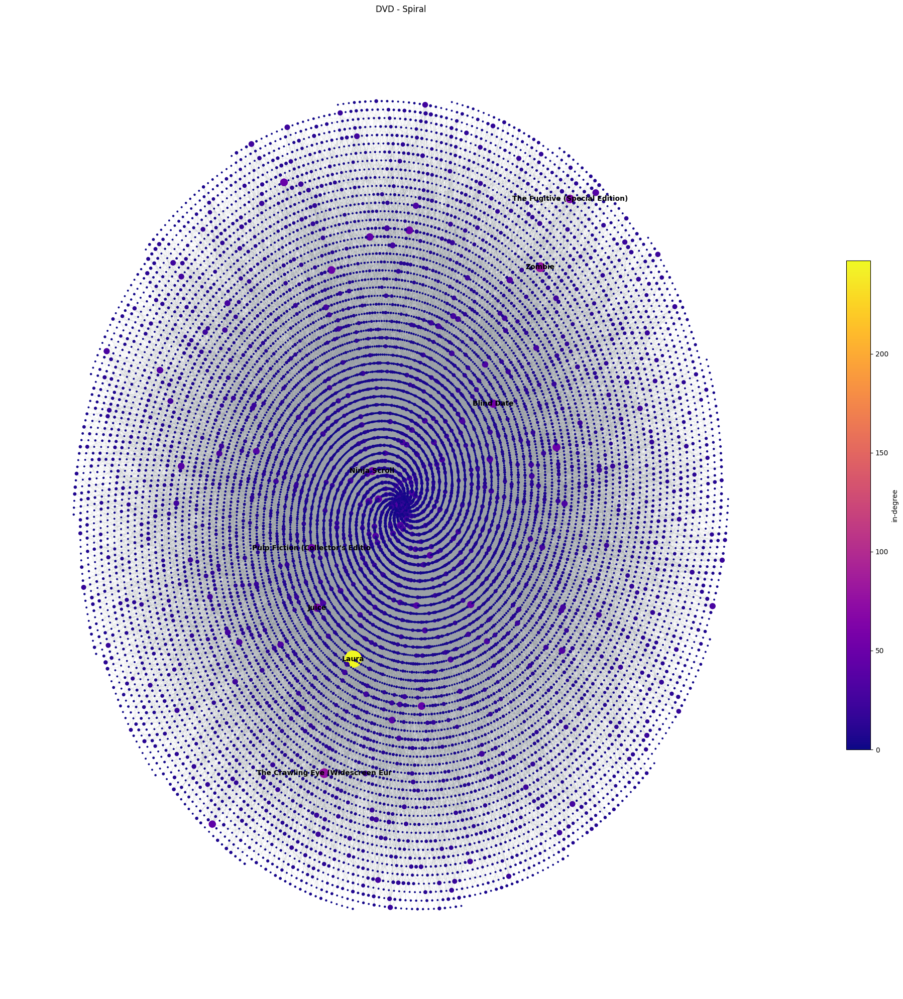

In [20]:
# Спиральная раскладка
draw(nx.spiral_layout(G), "DVD - Spiral", "#9aa0a6", "plasma", "data/dvd_spiral")

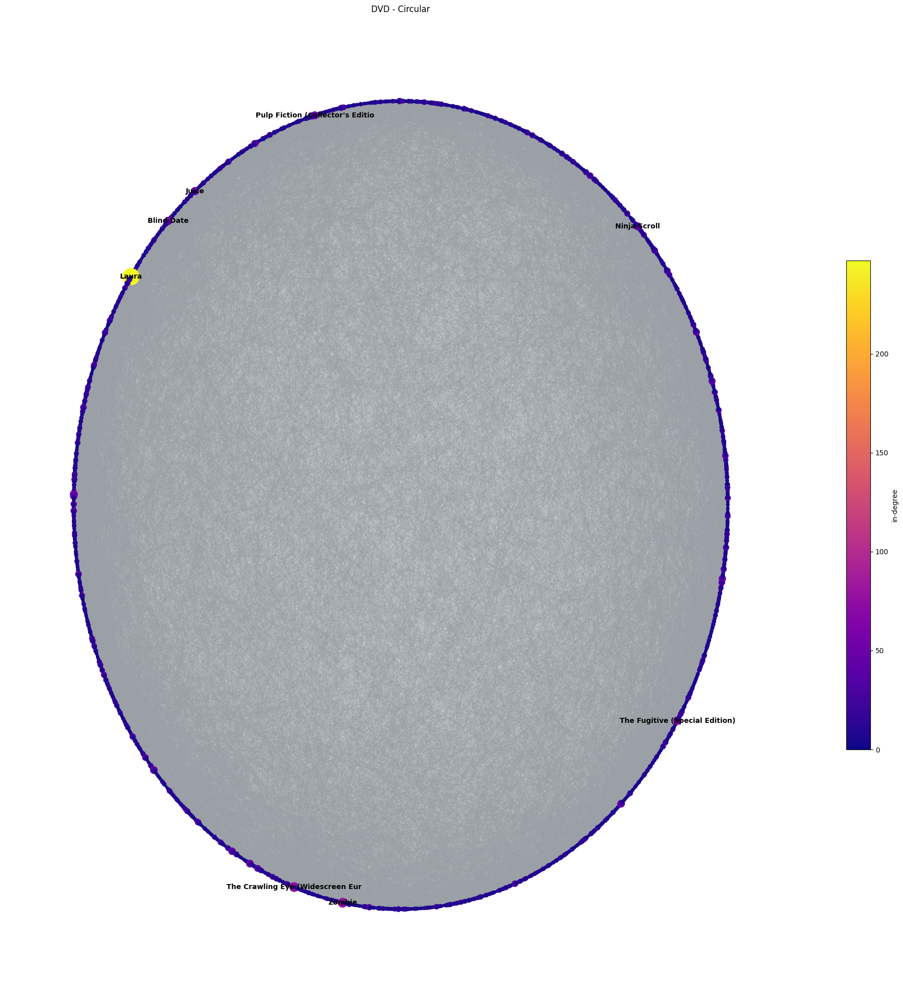

In [21]:
# Кольцевая раскладка
draw(nx.circular_layout(G), "DVD - Circular", "#9aa0a6", "plasma", "data/dvd_circular")

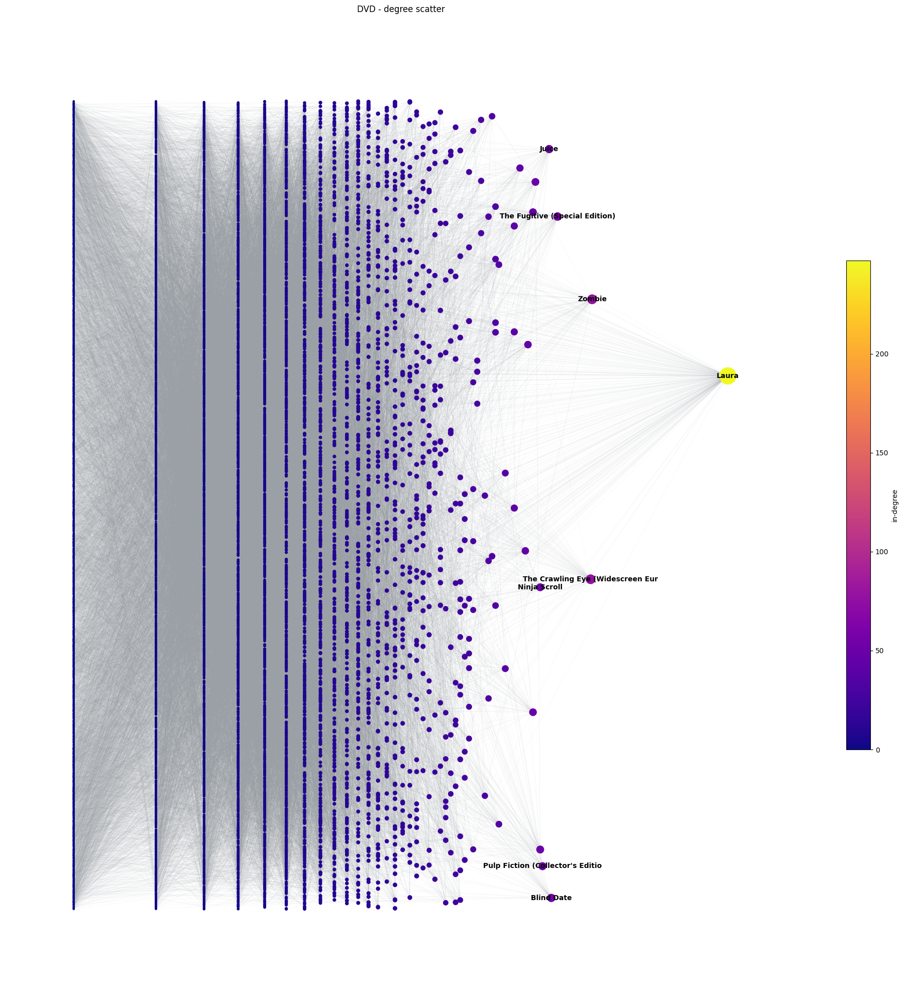

In [22]:
# Раскладка-разброс: чем больше входящих рёбер, тем правее вершина
def degree_scatter():
    indeg = dict(G.in_degree())
    m = max(indeg.values()) or 1
    rnd = random.Random(42)
    return {v: (math.log1p(indeg[v]) / math.log1p(m), rnd.random()) for v in G.nodes()}

draw(degree_scatter(), "DVD - degree scatter", "#9aa0a6", "plasma", "data/dvd_scatter")

## 5. Новая рекомендательная система

Ребро A → B значит «A рекомендует B». Три метода по-разному ищут похожие товары:

1. **two_hop** — расширение корзины. Идём на два шага: A → X → Y. Чем больше путей до Y, тем выше его оценка. Товары, которые A уже рекомендует напрямую, исключаем.

2. **cocitation** — общие «рекомендатели». A и Y похожи, если их рекомендует много одних и тех же товаров (смотрим назад по стрелкам). Оценка — число общих источников.

3. **bibcoupling** — общие «рекомендации». A и Y похожи, если они сами ссылаются на одни и те же товары (смотрим вперёд по стрелкам). Оценка — число общих целей.

In [23]:
# Топ-5 кандидатов на каждый товар из таблицы (a, y, count)
def top5(scored):
    w = Window.partitionBy("a").orderBy(F.desc("count"), F.asc("y"))
    return (scored.withColumn("rn", F.row_number().over(w)).filter("rn <= 5")
            .groupBy("a").pivot("rn", [1, 2, 3, 4, 5]).agg(F.first("y"))
            .toDF("id", "rec1", "rec2", "rec3", "rec4", "rec5"))

# 1. Расширение корзины: A -> X -> Y, исключая то, что A уже рекомендует
def two_hop(e):
    p = (e.selectExpr("src as a", "dst as x")
          .join(e.selectExpr("src as x", "dst as y"), "x")
          .select("a", "y").filter("a <> y"))
    direct = e.selectExpr("src as a", "dst as y").withColumn("d", F.lit(1))
    s = p.groupBy("a", "y").count().join(direct, ["a", "y"], "left").filter("d is null")
    return top5(s.select("a", "y", "count"))

# 2. Больше общих источников, которые рекомендуют и A, и Y
def cocitation(e):
    s = (e.selectExpr("src as s", "dst as a")
          .join(e.selectExpr("src as s", "dst as y"), "s").filter("a <> y")
          .groupBy("a", "y").agg(F.countDistinct("s").alias("count")))
    return top5(s)

# 3. Больше общих товаров, на которые ссылаются и A, и Y
def bibcoupling(e):
    s = (e.selectExpr("src as a", "dst as t")
          .join(e.selectExpr("src as y", "dst as t"), "t").filter("a <> y")
          .groupBy("a", "y").agg(F.countDistinct("t").alias("count")))
    return top5(s)

In [24]:
# Добор до 5 популярными товарами и запись в csv
popular = [r.dst for r in edges_df.groupBy("dst").count()
           .orderBy(F.desc("count")).limit(100).collect()]

neighbors = {}
for r in edges_df.collect():
    neighbors.setdefault(r.src, set()).add(r.dst)

def save(recs, path):
    rows = products_df.select("id").join(recs, "id", "left").collect()
    with open(path, "w", newline="") as f:
        w = csv.writer(f)
        w.writerow(["", "rec1", "rec2", "rec3", "rec4", "rec5"])
        for r in rows:
            cur = [c for c in (r.rec1, r.rec2, r.rec3, r.rec4, r.rec5) if c]
            seen = set(cur) | {r.id} | neighbors.get(r.id, set())
            for p in popular:
                if len(cur) >= 5:
                    break
                if p not in seen:
                    cur.append(p); seen.add(p)
            w.writerow([r.id] + (cur + [""] * 5)[:5])

save(two_hop(edges_df), "data/recomms_two_hop.csv")
save(cocitation(edges_df), "data/recomms_cocitation.csv")
save(bibcoupling(edges_df), "data/recomms_bibcoupling.csv")